In [211]:
import os
import re
import pandas as pd
import pickle
import networkx as nx
import matplotlib.pyplot as plt
from itertools import product


In [3]:
file_list = os.listdir('./networks/semantic')
print(file_list)

['fr_control_networks.pkl', 'fr_no_control_networks.pkl', 'es_no_control_networks.pkl', 'es_control_networks.pkl', 'eng_control_networks.pkl', 'el_no_control_networks.pkl', 'el_control_networks.pkl', 'eng_no_control_networks.pkl']


In [5]:
for file in file_list:
    print('*'*5, file, '*'*5)
    filename = (rf'./networks/semantic/{file}')
    with open(filename, "rb") as f:
        g = pickle.load(f)
    for label in g.keys():
        print(f'Label {label} has ', g[label])
    print('-'*20)
    filename = (rf'./networks/semantic/{file}')
    with open(filename, "rb") as f:
        g = pickle.load(f)
    for label in g.keys():
        print(f'Label {label} has ', g[label])
    print('*'*20)

***** fr_control_networks.pkl *****
Label injuste_a has  Graph with 56 nodes and 95 edges
Label ingéniosité_n has  Graph with 48 nodes and 95 edges
Label bâtir_v has  Graph with 55 nodes and 95 edges
Label couramment_r has  Graph with 49 nodes and 94 edges
Label outrage_n has  Graph with 56 nodes and 95 edges
Label atrocité_n has  Graph with 54 nodes and 95 edges
Label documentation_n has  Graph with 53 nodes and 95 edges
Label ascendance_n has  Graph with 35 nodes and 95 edges
Label expulser_v has  Graph with 57 nodes and 95 edges
Label fillette_n has  Graph with 40 nodes and 95 edges
Label monopoliser_v has  Graph with 54 nodes and 95 edges
Label progressivement_r has  Graph with 51 nodes and 95 edges
Label négation_n has  Graph with 49 nodes and 95 edges
Label linguiste_n has  Graph with 54 nodes and 95 edges
Label dénommer_v has  Graph with 50 nodes and 95 edges
--------------------
***** fr_no_control_networks.pkl *****
Label injuste_a has  Graph with 52 nodes and 95 edges
Label i

In [15]:
def get_nodes_and_edges(graph, label):
    s = str(graph[label])
    pattern = r"(\d+)\s*(?=nodes|edges)"
    matches = re.findall(pattern, s)
    nodes, edges = int(matches[0]), int(matches[1])
    return nodes, edges

In [65]:
list_of_rows = []
for file in file_list:
    print('*'*5, file, '*'*5)
    filename = (rf'./networks/semantic/{file}')
    with open(filename, "rb") as f:
        _g = pickle.load(f)
    for _label in _g.keys():
        nodes, edges = get_nodes_and_edges(_g, _label)
        ctrl_flag = 'control' if file.split('_')[1].lower() == 'control' else 'no_control'
        print(ctrl_flag)
        list_of_rows.append([
        file.split('_')[0], ctrl_flag, _label, nodes, edges
        ]
        
    )
    print('-'*20)

***** fr_control_networks.pkl *****
control
control
control
control
control
control
control
control
control
control
control
control
control
control
control
--------------------
***** fr_no_control_networks.pkl *****
no_control
no_control
no_control
no_control
no_control
no_control
no_control
no_control
no_control
no_control
no_control
no_control
no_control
no_control
no_control
--------------------
***** es_no_control_networks.pkl *****
no_control
no_control
no_control
no_control
no_control
no_control
no_control
no_control
no_control
no_control
no_control
no_control
no_control
no_control
no_control
--------------------
***** es_control_networks.pkl *****
control
control
control
control
control
control
control
control
control
control
control
control
control
control
control
--------------------
***** eng_control_networks.pkl *****
control
control
control
control
control
control
control
control
control
control
control
control
control
control
control
--------------------
***** el_no_contro

In [58]:
# list_of_rows[0]
'eng_control_networks.pkl'.split('_')[1]

'control'

In [66]:
details_df = pd.DataFrame(data=list_of_rows, columns=['language', 'ctrl_flag', 'word',
                                        'nodes', 'edges'])
details_df.head()

,language,ctrl_flag,word,nodes,edges
0,fr,control,injuste_a,56,95
1,fr,control,ingéniosité_n,48,95
2,fr,control,bâtir_v,55,95
3,fr,control,couramment_r,49,94
4,fr,control,outrage_n,56,95


In [67]:
details_df[details_df['language']=='eng']

,language,ctrl_flag,word,nodes,edges
60,eng,control,exceed_v,60,145
61,eng,control,blow_n,65,290
62,eng,control,accord_v,95,535
63,eng,control,identify_v,99,880
64,eng,control,build_v,114,1325
65,eng,control,national_a,98,1870
66,eng,control,popular_a,131,2515
67,eng,control,flow_v,146,3260
68,eng,control,emotional_a,129,4105
69,eng,control,check_n,163,5050


In [43]:
# details_df.groupby(['language', 'ctrl_flag', 'word']).sum().to_csv('Language_details.csv')

In [44]:
file_list

['fr_control_networks.pkl',
 'fr_no_control_networks.pkl',
 'es_no_control_networks.pkl',
 'es_control_networks.pkl',
 'eng_control_networks.pkl',
 'el_no_control_networks.pkl',
 'el_control_networks.pkl',
 'eng_no_control_networks.pkl']

In [69]:
file_name = 'eng_control_networks.pkl'
file_path = './networks/semantic'

full_file_path = file_path + '/' + file_name
print(full_file_path)
with open(full_file_path, "rb") as f:
    eng_graph = pickle.load(f)

./networks/semantic/eng_control_networks.pkl


In [70]:
print(eng_graph.keys())

dict_keys(['exceed_v', 'blow_n', 'accord_v', 'identify_v', 'build_v', 'national_a', 'popular_a', 'flow_v', 'emotional_a', 'check_n', 'maximum_n', 'ability_n', 'west_n', 'instant_n', 'arise_v'])


In [71]:
label = 'arise_v'
print(eng_graph[label])


Graph with 215 nodes and 11275 edges


In [72]:
eng_graph[label]

In [73]:
eng_graph

{'exceed_v': <networkx.classes.graph.Graph at 0x7fd0b28d7100>,
 'blow_n': <networkx.classes.graph.Graph at 0x7fd0b28d7760>,
 'accord_v': <networkx.classes.graph.Graph at 0x7fd0b28d7640>,
 'identify_v': <networkx.classes.graph.Graph at 0x7fd0b28d7460>,
 'build_v': <networkx.classes.graph.Graph at 0x7fd09e196d00>,
 'national_a': <networkx.classes.graph.Graph at 0x7fd09e196c10>,
 'popular_a': <networkx.classes.graph.Graph at 0x7fd09e1967f0>,
 'flow_v': <networkx.classes.graph.Graph at 0x7fd09d65ca00>,
 'emotional_a': <networkx.classes.graph.Graph at 0x7fd0a151afa0>,
 'check_n': <networkx.classes.graph.Graph at 0x7fd0b0f1f6d0>,
 'maximum_n': <networkx.classes.graph.Graph at 0x7fd0b0f1fdf0>,
 'ability_n': <networkx.classes.graph.Graph at 0x7fd0b0f1f700>,
 'west_n': <networkx.classes.graph.Graph at 0x7fd0b0f1faf0>,
 'instant_n': <networkx.classes.graph.Graph at 0x7fd0b0f1f5e0>,
 'arise_v': <networkx.classes.graph.Graph at 0x7fd0b0f1ff10>}

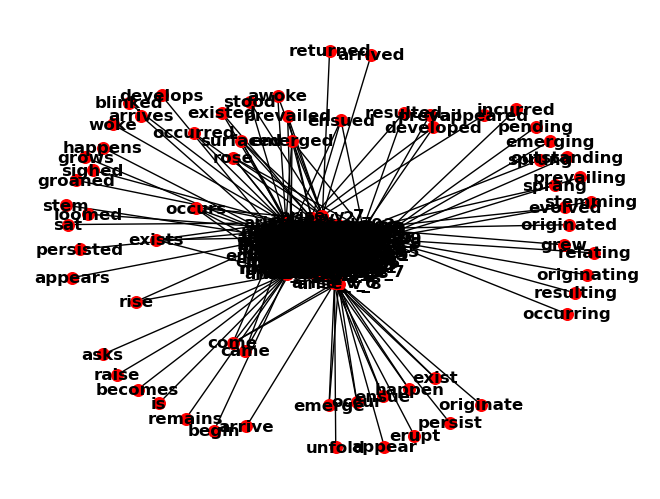

In [75]:
pos = nx.spring_layout(eng_graph[label])
nx.draw(eng_graph[label], pos, with_labels=True,
         font_weight='bold', node_size=70,
           node_color='red', edge_color='black')
plt.show()

In [81]:
set(eng_graph[label].nodes())
# eng_graph[label], label

{'ability_n_0',
 'ability_n_1',
 'ability_n_2',
 'ability_n_3',
 'ability_n_4',
 'ability_n_5',
 'ability_n_6',
 'ability_n_7',
 'ability_n_8',
 'ability_n_9',
 'accord_v_0',
 'accord_v_1',
 'accord_v_2',
 'accord_v_3',
 'accord_v_4',
 'accord_v_5',
 'accord_v_6',
 'accord_v_7',
 'accord_v_8',
 'accord_v_9',
 'appear',
 'appeared',
 'appears',
 'arise_v_0',
 'arise_v_1',
 'arise_v_2',
 'arise_v_3',
 'arise_v_4',
 'arise_v_5',
 'arise_v_6',
 'arise_v_7',
 'arise_v_8',
 'arise_v_9',
 'arrive',
 'arrived',
 'arrives',
 'asks',
 'awoke',
 'becomes',
 'begin',
 'blinked',
 'blow_n_0',
 'blow_n_1',
 'blow_n_2',
 'blow_n_3',
 'blow_n_4',
 'blow_n_5',
 'blow_n_6',
 'blow_n_7',
 'blow_n_8',
 'blow_n_9',
 'build_v_0',
 'build_v_1',
 'build_v_2',
 'build_v_3',
 'build_v_4',
 'build_v_5',
 'build_v_6',
 'build_v_7',
 'build_v_8',
 'build_v_9',
 'came',
 'check_n_0',
 'check_n_1',
 'check_n_2',
 'check_n_3',
 'check_n_4',
 'check_n_5',
 'check_n_6',
 'check_n_7',
 'check_n_8',
 'check_n_9',
 'come'

In [80]:
eng_graph[label].nodes()

NodeView(('arise_v_0', 'emerged', 'sprang', 'resulted', 'sprung', 'originated', 'grew', 'evolved', 'rose', 'ensued', 'developed', 'arise_v_1', 'occurs', 'becomes', 'is', 'exists', 'remains', 'rise', 'asks', 'come', 'begin', 'raise', 'arise_v_2', 'existed', 'occurred', 'prevailed', 'surfaced', 'arise_v_3', 'awoke', 'stood', 'woke', 'sighed', 'groaned', 'blinked', 'sat', 'arise_v_4', 'grows', 'arrives', 'develops', 'happens', 'appears', 'stem', 'arise_v_5', 'persisted', 'loomed', 'came', 'arise_v_6', 'occur', 'emerge', 'ensue', 'happen', 'unfold', 'erupt', 'arrive', 'exist', 'prevail', 'arise_v_7', 'appeared', 'arrived', 'returned', 'arise_v_8', 'persist', 'appear', 'originate', 'arise_v_9', 'stemming', 'originating', 'resulting', 'occurring', 'relating', 'incurred', 'pending', 'outstanding', 'prevailing', 'emerging', 'exceed_v_0', 'exceed_v_1', 'exceed_v_2', 'exceed_v_3', 'exceed_v_4', 'exceed_v_5', 'exceed_v_6', 'exceed_v_7', 'exceed_v_8', 'exceed_v_9', 'blow_n_0', 'blow_n_1', 'blow_n_

In [140]:
import networkx as nx
import re

# Assuming eng_graph[label] is your original graph
G = eng_graph[label]

# Function to extract base word from node label
def get_base_word(node_label):
    pattern = r'^(\w+_\w+)_\d+'
    match = re.match(pattern, node_label)
    if match:
        return match.group(1)
    else:
        return node_label

# Create a new graph for clustering
G_clustered = nx.Graph()

# Map nodes to their base words
node_base_map = {node: get_base_word(node) for node in G.nodes()}

# Add nodes to the clustered graph
G_clustered.add_nodes_from(set(node_base_map.values()))

# Add edges to the clustered graph
for edge in G.edges():
    node1_base = node_base_map[edge[0]]
    node2_base = node_base_map[edge[1]]
    if node1_base != node2_base:  # Avoid self-loops
        G_clustered.add_edge(node1_base, node2_base)


In [121]:
# G.edges()

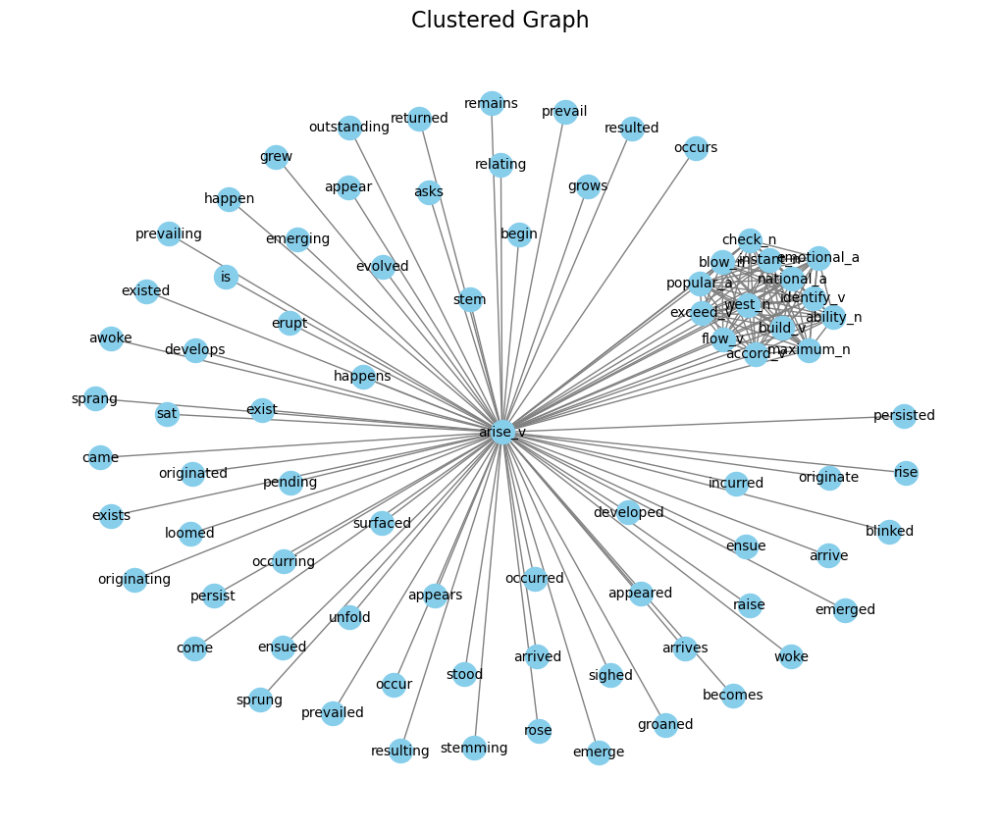

In [141]:
# Adjusting the layout for better visualization
pos = nx.spring_layout(G_clustered, seed=42)

# Drawing the graph with improved settings
plt.figure(figsize=(10, 8))
nx.draw(G_clustered, pos, with_labels=True, font_size=10,
        node_size=300, node_color='skyblue',
        edge_color='gray', width=1, style='solid')
plt.title("Clustered Graph", fontsize=16)
plt.show()

In [162]:
# Direct links
edge_list_for_arise = []
for edge in G.edges():
    if ('arise' in edge[0]) and ('_' not in edge[1]):
        print(edge)
        edge_list_for_arise.append(edge)
    elif ('arise' in edge[0]) and ('arise' in edge[1]):
        print(edge)
        edge_list_for_arise.append(edge)
    else:
        continue

('arise_v_0', 'emerged')
('arise_v_0', 'sprang')
('arise_v_0', 'resulted')
('arise_v_0', 'sprung')
('arise_v_0', 'originated')
('arise_v_0', 'grew')
('arise_v_0', 'evolved')
('arise_v_0', 'rose')
('arise_v_0', 'ensued')
('arise_v_0', 'developed')
('arise_v_0', 'arise_v_1')
('arise_v_0', 'arise_v_2')
('arise_v_0', 'arise_v_3')
('arise_v_0', 'arise_v_4')
('arise_v_0', 'arise_v_5')
('arise_v_0', 'arise_v_6')
('arise_v_0', 'arise_v_7')
('arise_v_0', 'arise_v_8')
('arise_v_0', 'arise_v_9')
('arise_v_1', 'occurs')
('arise_v_1', 'becomes')
('arise_v_1', 'is')
('arise_v_1', 'exists')
('arise_v_1', 'remains')
('arise_v_1', 'rise')
('arise_v_1', 'asks')
('arise_v_1', 'come')
('arise_v_1', 'begin')
('arise_v_1', 'raise')
('arise_v_1', 'arise_v_2')
('arise_v_1', 'arise_v_3')
('arise_v_1', 'arise_v_4')
('arise_v_1', 'arise_v_5')
('arise_v_1', 'arise_v_6')
('arise_v_1', 'arise_v_7')
('arise_v_1', 'arise_v_8')
('arise_v_1', 'arise_v_9')
('arise_v_2', 'existed')
('arise_v_2', 'occurred')
('arise_v_2',

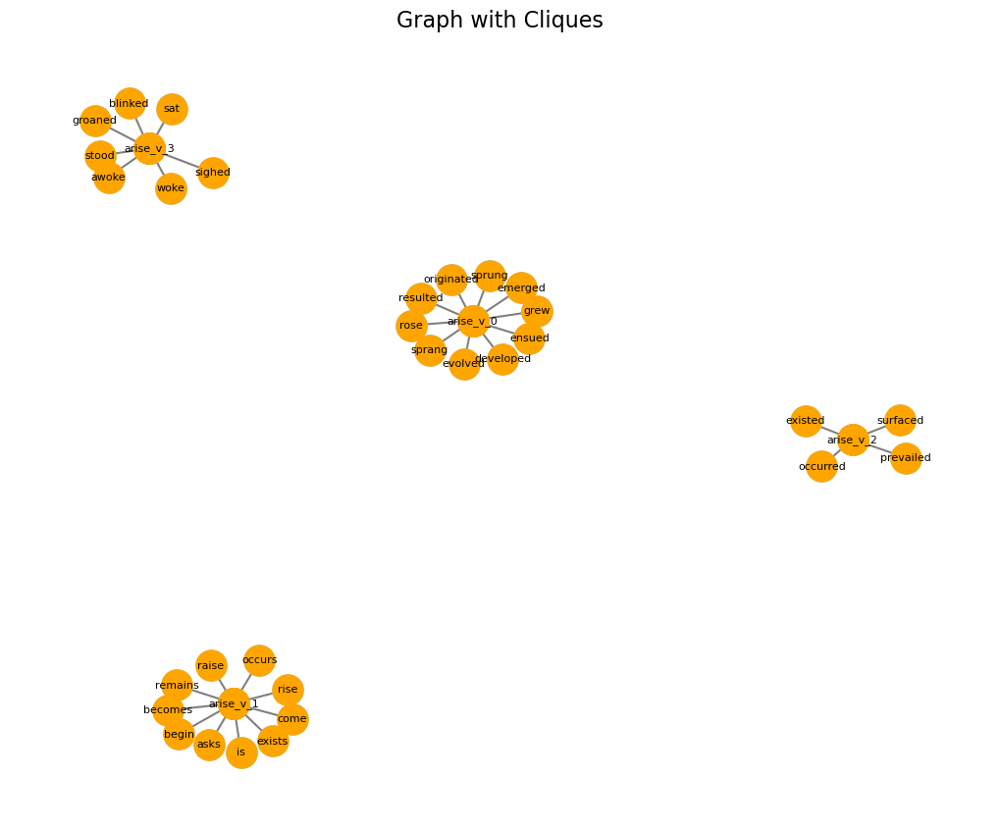

In [143]:
import networkx as nx
import matplotlib.pyplot as plt

# Define the edges in your graph
edges = [
    ('arise_v_0', 'emerged'), ('arise_v_0', 'sprang'), ('arise_v_0', 'resulted'),
    ('arise_v_0', 'sprung'), ('arise_v_0', 'originated'), ('arise_v_0', 'grew'),
    ('arise_v_0', 'evolved'), ('arise_v_0', 'rose'), ('arise_v_0', 'ensued'),
    ('arise_v_0', 'developed'), ('arise_v_1', 'occurs'), ('arise_v_1', 'becomes'),
    ('arise_v_1', 'is'), ('arise_v_1', 'exists'), ('arise_v_1', 'remains'),
    ('arise_v_1', 'rise'), ('arise_v_1', 'asks'), ('arise_v_1', 'come'),
    ('arise_v_1', 'begin'), ('arise_v_1', 'raise'), ('arise_v_2', 'existed'),
    ('arise_v_2', 'occurred'), ('arise_v_2', 'prevailed'), ('arise_v_2', 'surfaced'),
    ('arise_v_3', 'awoke'), ('arise_v_3', 'stood'), ('arise_v_3', 'woke'),
    ('arise_v_3', 'sighed'), ('arise_v_3', 'groaned'), ('arise_v_3', 'blinked'),
    ('arise_v_3', 'sat')
]

# Create a graph
G_new = nx.Graph()

# Add edges to the graph
G_new.add_edges_from(edges)

# Find all cliques in the graph
cliques = list(nx.find_cliques(G_new))

# Visualize the graph
plt.figure(figsize=(10, 8))
pos = nx.spring_layout(G_new, seed=42)
nx.draw(G_new, pos, with_labels=True, font_size=8, node_size=500, node_color='skyblue', edge_color='gray', width=1.5)
plt.title("Graph with Cliques", fontsize=16)

# Highlight cliques in different colors
for i, clique in enumerate(cliques):
    nx.draw_networkx_nodes(G_new, pos, nodelist=clique, node_color='orange', node_size=500)

plt.show()

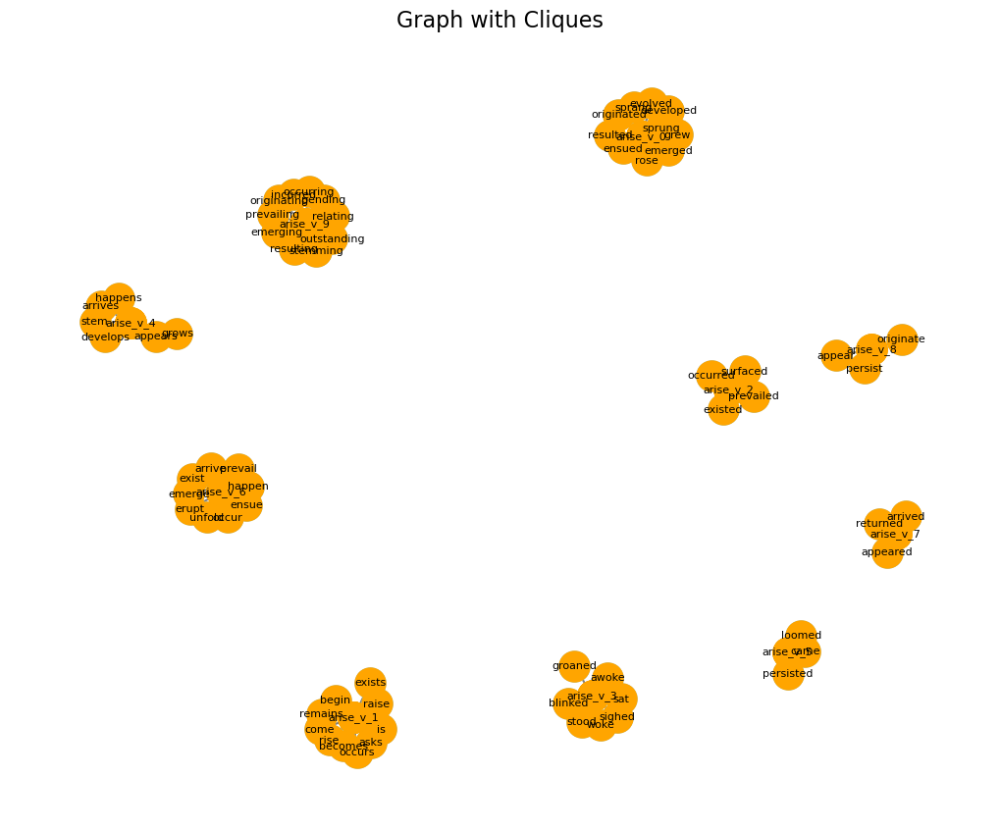

In [146]:
from copy import deepcopy


# Define the edges in your graph
edges = deepcopy(edge_list_for_arise)

# Create a graph
G_ = nx.Graph()

# Add edges to the graph
G_.add_edges_from(edge_list_for_arise)

# Find all cliques in the graph
cliques = list(nx.find_cliques(G_))

# Visualize the graph
plt.figure(figsize=(10, 8))
pos = nx.spring_layout(G_, seed=23)
nx.draw(G_, pos, with_labels=True, font_size=8,
        node_size=500, node_color='skyblue', edge_color='gray', width=1.5)
plt.title("Graph with Cliques", fontsize=16)

# Highlight cliques in different colors
for i, clique in enumerate(cliques):
    nx.draw_networkx_nodes(G_, pos, nodelist=clique,
                           node_color='orange', node_size=500)

plt.show()

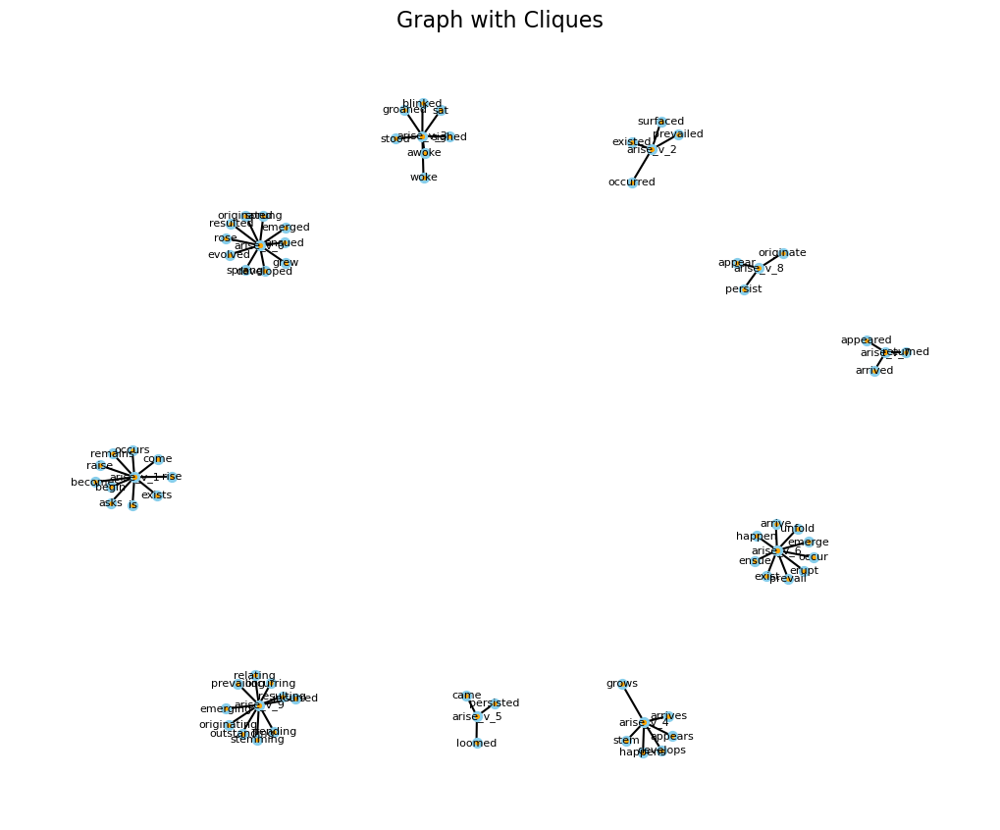

In [155]:
import networkx as nx
import matplotlib.pyplot as plt

# Define the connections between word senses
connections = deepcopy(edge_list_for_arise)
# [
#     ('arise_v_0', 'emerged'), ('arise_v_0', 'sprang'), ('arise_v_0', 'resulted'),
#     ('arise_v_0', 'sprung'), ('arise_v_0', 'originated'), ('arise_v_0', 'grew'),
#     ('arise_v_0', 'evolved'), ('arise_v_0', 'rose'), ('arise_v_0', 'ensued'),
#     ('arise_v_0', 'developed'), ('arise_v_1', 'occurs'), ('arise_v_1', 'becomes'),
#     ('arise_v_1', 'is'), ('arise_v_1', 'exists'), ('arise_v_1', 'remains'),
#     ('arise_v_1', 'rise'), ('arise_v_1', 'asks'), ('arise_v_1', 'come'),
#     ('arise_v_1', 'begin'), ('arise_v_1', 'raise'), ('arise_v_2', 'existed'),
#     ('arise_v_2', 'occurred'), ('arise_v_2', 'prevailed'), ('arise_v_2', 'surfaced'),
#     ('arise_v_3', 'awoke'), ('arise_v_3', 'stood'), ('arise_v_3', 'woke'),
#     ('arise_v_3', 'sighed'), ('arise_v_3', 'groaned'), ('arise_v_3', 'blinked'),
#     ('arise_v_3', 'sat')
# ]

# Create a graph
G_con = nx.Graph()

# Add connections to the graph
G_con.add_edges_from(connections)

# Find all cliques in the graph
cliques = list(nx.find_cliques(G_con))

# Visualize the graph
plt.figure(figsize=(10, 8))
pos = nx.spring_layout(G_con, seed=42)
nx.draw(G_con, pos, with_labels=True, font_size=8, node_size=50, node_color='skyblue', edge_color='black', width=1.5)
plt.title("Graph with Cliques", fontsize=16)

# Highlight cliques in different colors
for i, clique in enumerate(cliques):
    nx.draw_networkx_nodes(G_con, pos, nodelist=clique, node_color='orange', node_size=5)

plt.show()


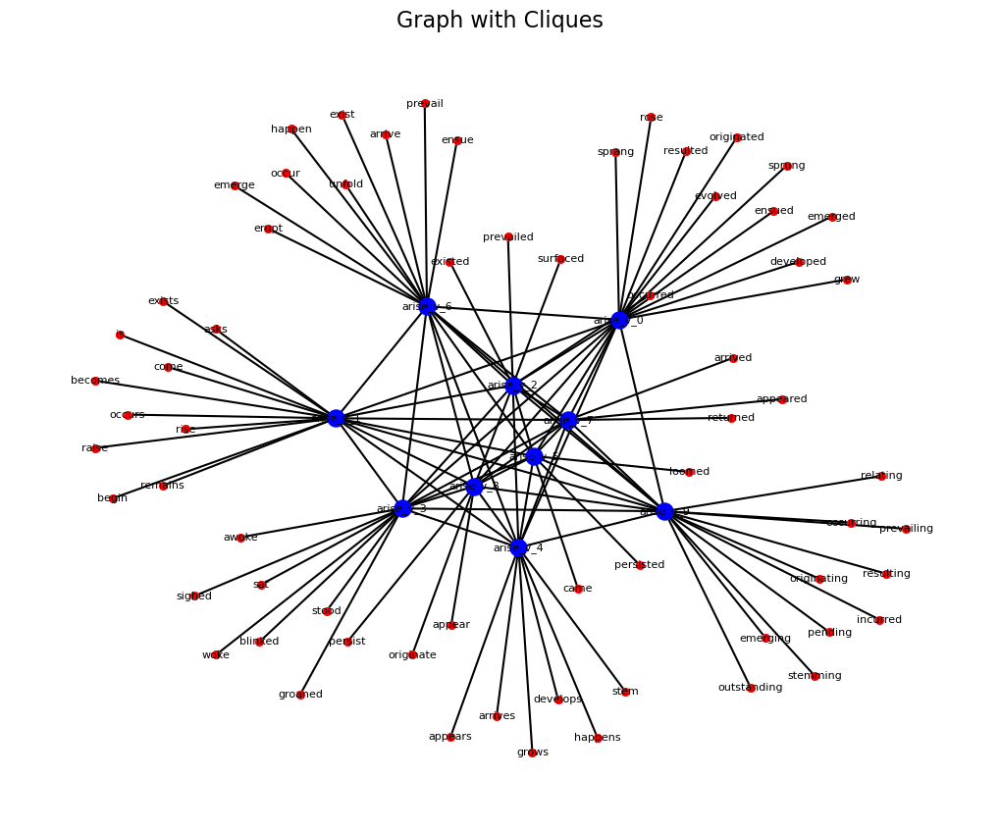

In [163]:
import networkx as nx
import matplotlib.pyplot as plt

# Define the connections between word senses
connections = deepcopy(edge_list_for_arise)
# [
#     ('arise_v_0', 'emerged'), ('arise_v_0', 'sprang'), ('arise_v_0', 'resulted'),
#     ('arise_v_0', 'sprung'), ('arise_v_0', 'originated'), ('arise_v_0', 'grew'),
#     ('arise_v_0', 'evolved'), ('arise_v_0', 'rose'), ('arise_v_0', 'ensued'),
#     ('arise_v_0', 'developed'), ('arise_v_1', 'occurs'), ('arise_v_1', 'becomes'),
#     ('arise_v_1', 'is'), ('arise_v_1', 'exists'), ('arise_v_1', 'remains'),
#     ('arise_v_1', 'rise'), ('arise_v_1', 'asks'), ('arise_v_1', 'come'),
#     ('arise_v_1', 'begin'), ('arise_v_1', 'raise'), ('arise_v_2', 'existed'),
#     ('arise_v_2', 'occurred'), ('arise_v_2', 'prevailed'), ('arise_v_2', 'surfaced'),
#     ('arise_v_3', 'awoke'), ('arise_v_3', 'stood'), ('arise_v_3', 'woke'),
#     ('arise_v_3', 'sighed'), ('arise_v_3', 'groaned'), ('arise_v_3', 'blinked'),
#     ('arise_v_3', 'sat')
# ]

# Create a graph
G_con = nx.Graph()

# Add connections to the graph
G_con.add_edges_from(connections)

# Find all cliques in the graph
cliques = list(nx.find_cliques(G_con))

# Visualize the graph
plt.figure(figsize=(10, 8))
pos = nx.spring_layout(G_con, seed=42)

# Draw nodes and edges
nx.draw(G_con, pos, with_labels=True, font_size=8, node_size=30, node_color='skyblue', edge_color='black', width=1.5)


# Highlight cliques in different colors
for i, clique in enumerate(cliques):
    nx.draw_networkx_nodes(G_con, pos, nodelist=clique, node_color='red', node_size=30)

# Highlight "arise_v" nodes in a different color
arise_v_nodes = [node for node in G_con.nodes() if node.startswith('arise_v')]
nx.draw_networkx_nodes(G_con, pos, nodelist=arise_v_nodes, node_color='blue', node_size=150)

plt.title("Graph with Cliques", fontsize=16)
plt.show()


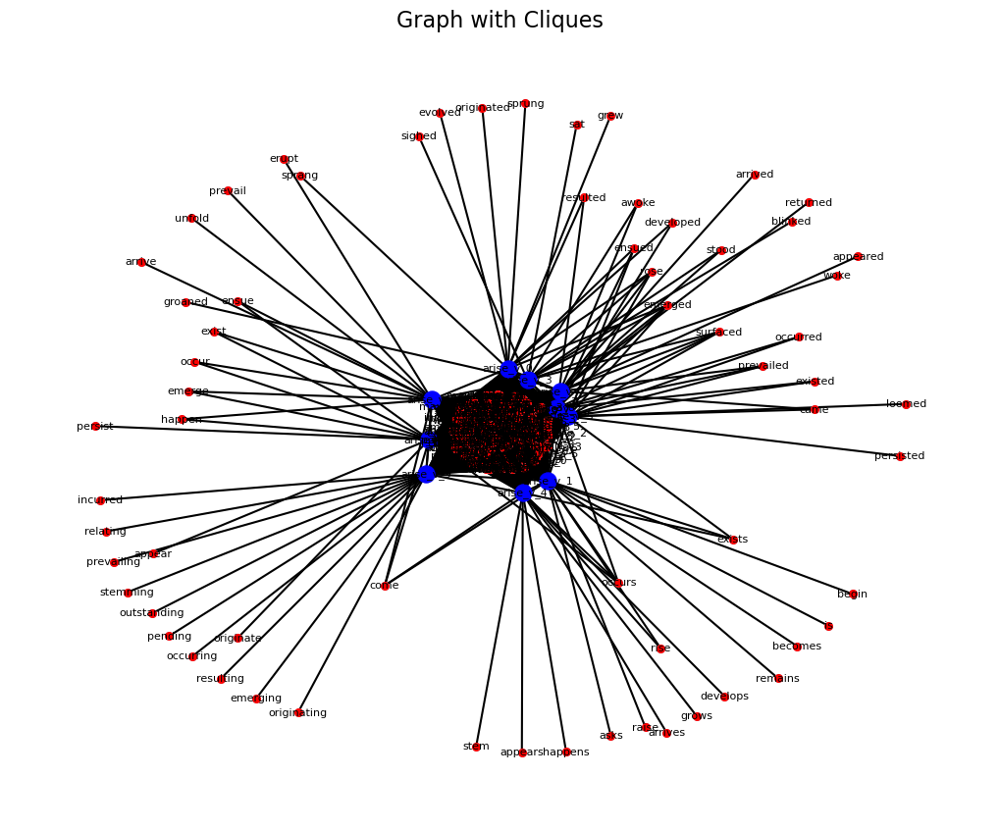

In [164]:
# G.edges()

import networkx as nx
import matplotlib.pyplot as plt

# Define the connections between word senses
connections = deepcopy(G.edges())
# [
#     ('arise_v_0', 'emerged'), ('arise_v_0', 'sprang'), ('arise_v_0', 'resulted'),
#     ('arise_v_0', 'sprung'), ('arise_v_0', 'originated'), ('arise_v_0', 'grew'),
#     ('arise_v_0', 'evolved'), ('arise_v_0', 'rose'), ('arise_v_0', 'ensued'),
#     ('arise_v_0', 'developed'), ('arise_v_1', 'occurs'), ('arise_v_1', 'becomes'),
#     ('arise_v_1', 'is'), ('arise_v_1', 'exists'), ('arise_v_1', 'remains'),
#     ('arise_v_1', 'rise'), ('arise_v_1', 'asks'), ('arise_v_1', 'come'),
#     ('arise_v_1', 'begin'), ('arise_v_1', 'raise'), ('arise_v_2', 'existed'),
#     ('arise_v_2', 'occurred'), ('arise_v_2', 'prevailed'), ('arise_v_2', 'surfaced'),
#     ('arise_v_3', 'awoke'), ('arise_v_3', 'stood'), ('arise_v_3', 'woke'),
#     ('arise_v_3', 'sighed'), ('arise_v_3', 'groaned'), ('arise_v_3', 'blinked'),
#     ('arise_v_3', 'sat')
# ]

# Create a graph
G_con = nx.Graph()

# Add connections to the graph
G_con.add_edges_from(connections)

# Find all cliques in the graph
cliques = list(nx.find_cliques(G_con))

# Visualize the graph
plt.figure(figsize=(10, 8))
pos = nx.spring_layout(G_con, seed=42)

# Draw nodes and edges
nx.draw(G_con, pos, with_labels=True, font_size=8, node_size=30, node_color='skyblue', edge_color='black', width=1.5)


# Highlight cliques in different colors
for i, clique in enumerate(cliques):
    nx.draw_networkx_nodes(G_con, pos, nodelist=clique, node_color='red', node_size=30)

# Highlight "arise_v" nodes in a different color
arise_v_nodes = [node for node in G_con.nodes() if node.startswith('arise_v')]
nx.draw_networkx_nodes(G_con, pos, nodelist=arise_v_nodes, node_color='blue', node_size=150)

plt.title("Graph with Cliques", fontsize=16)
plt.show()


In [170]:
# [len(clique) for clique in cliques]
cliques_as_per_length = {}

for clique in cliques:
    length = len(clique)
    
    if length in cliques_as_per_length:
        cliques_as_per_length[length].append(clique)
    else:
        cliques_as_per_length[length] = [clique]


In [171]:
cliques_as_per_length.keys()

dict_keys([3, 2, 150, 5, 4, 6])

In [176]:
for i in cliques_as_per_length.keys():
    print('clique length', i, 'has number of subgraphs', len(cliques_as_per_length[i]))

clique length 3 has number of subgraphs 13
clique length 2 has number of subgraphs 44
clique length 150 has number of subgraphs 1
clique length 5 has number of subgraphs 4
clique length 4 has number of subgraphs 3
clique length 6 has number of subgraphs 1


In [216]:
(clique)

['emerged', 'arise_v_7', 'arise_v_0', 'arise_v_3', 'arise_v_2', 'arise_v_5']

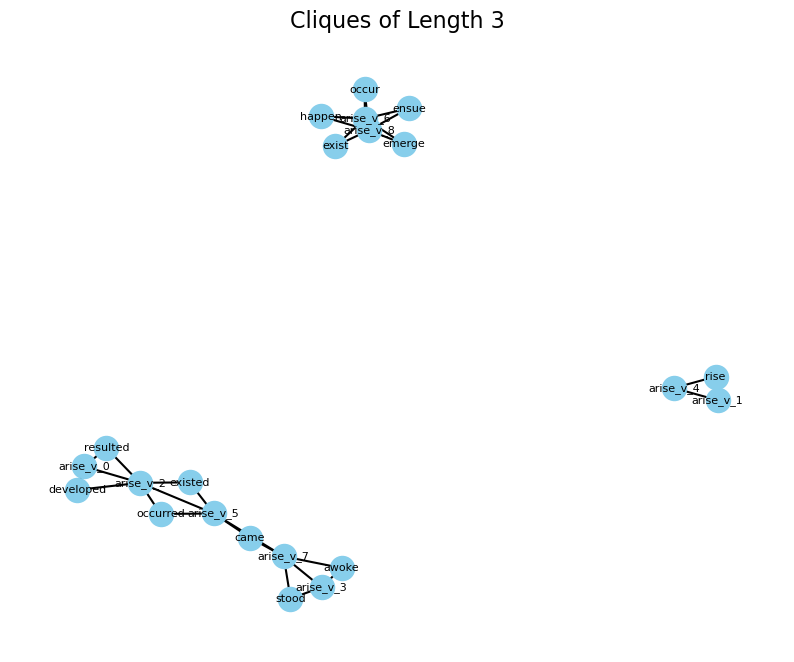

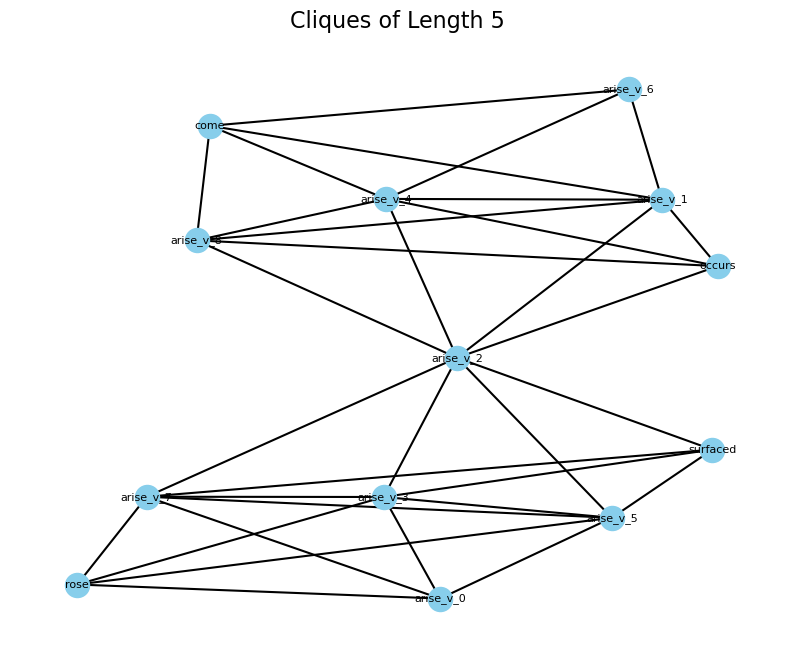

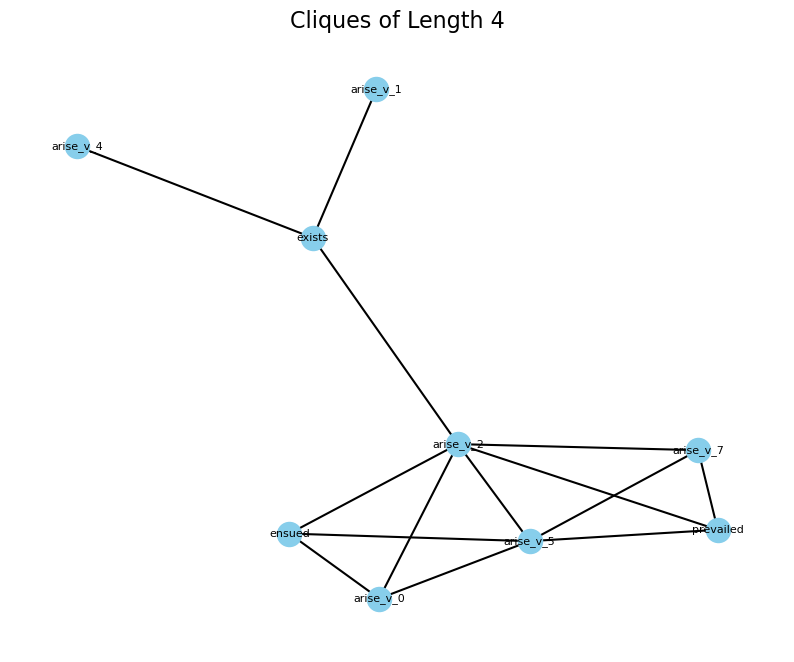

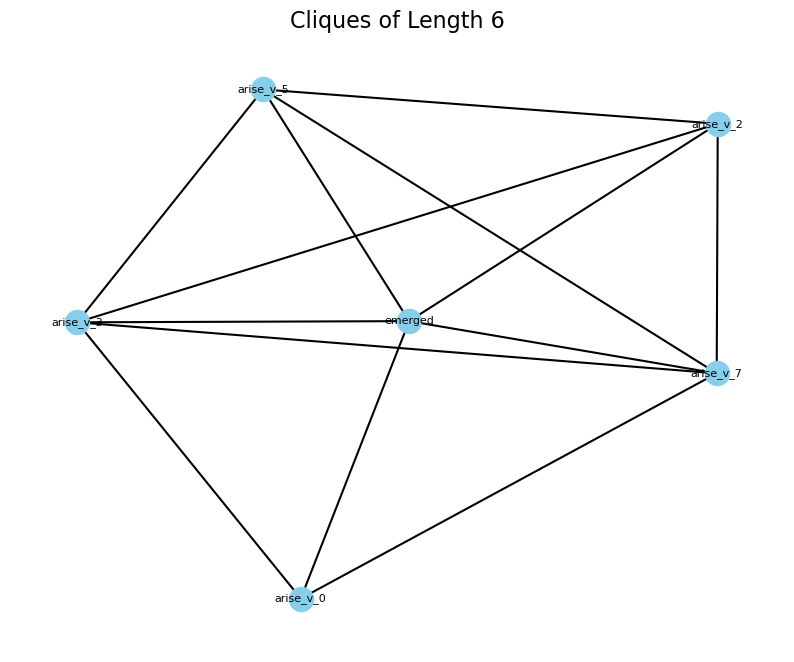

In [213]:
import networkx as nx
import matplotlib.pyplot as plt

# Assuming cliques_as_per_length is your dictionary containing cliques grouped by their lengths

# Iterate over the dictionary and plot each clique with length > 2
for length, cliques_list in cliques_as_per_length.items():
    if (length > 2) and (length!=150):
        # Create a new graph for the current clique length
        plt.figure(figsize=(10, 8))
        plt.title("Cliques of Length {}".format(length), fontsize=16)
        G_sub = nx.Graph()

        # Add all cliques of the current length to the graph
        for clique in cliques_list:
            # Add edges between nodes in the clique
            # G_sub.add_edges_from([(clique[i], clique[j]) for i in range(len(clique)) for j in range(i+1, len(clique))])
            clique_product_list = [(x, y) for x, y in product(clique, repeat=2) if x != y]
            new_product_list = [(x, y) for x, y in clique_product_list if (y, x) not in new_product_list]
            clique_edges = [(u, v) for u, v in new_product_list  if G.has_edge(u, v)]
            G_sub.add_edges_from(clique_edges)
        # Generate positions for the nodes
        pos = nx.spring_layout(G_sub, seed=42)

        # Draw the subgraph
        nx.draw(G_sub, pos, with_labels=True, font_size=8, node_size=300, node_color='skyblue', edge_color='black', width=1.5)
        plt.show()


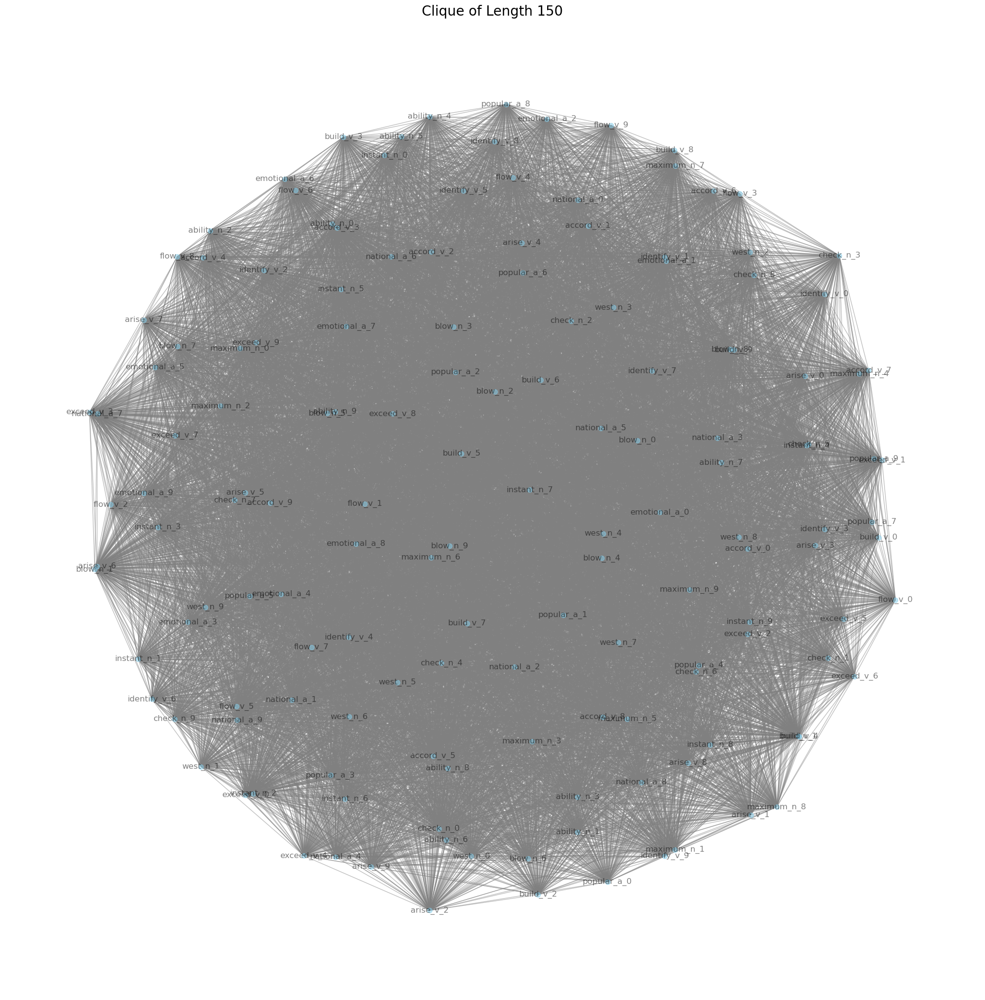

In [184]:
import networkx as nx
import matplotlib.pyplot as plt

# Assuming clique_150 is the list containing the clique of length 150
clique_150 = cliques_as_per_length[150][0]

# Create a new graph
G_clique_150 = nx.Graph()

# Add edges between all nodes in the clique
G_clique_150.add_edges_from([(clique_150[i], clique_150[j]) for i in range(len(clique_150)) for j in range(i+1, len(clique_150))])

# Generate positions for the nodes using a spring layout algorithm
pos = nx.spring_layout(G_clique_150, seed=42)

# Draw the graph
plt.figure(figsize=(20, 20))
nx.draw(G_clique_150, pos, with_labels=True, node_size=50, node_color='skyblue', edge_color='gray', alpha=0.5)

# Customize the plot
plt.title("Clique of Length 150", fontsize=20)
plt.axis('off')

# Show the plot
plt.show()


In [183]:
# cliques_as_per_length[150][0]

In [187]:
# len(clique_150)

11175


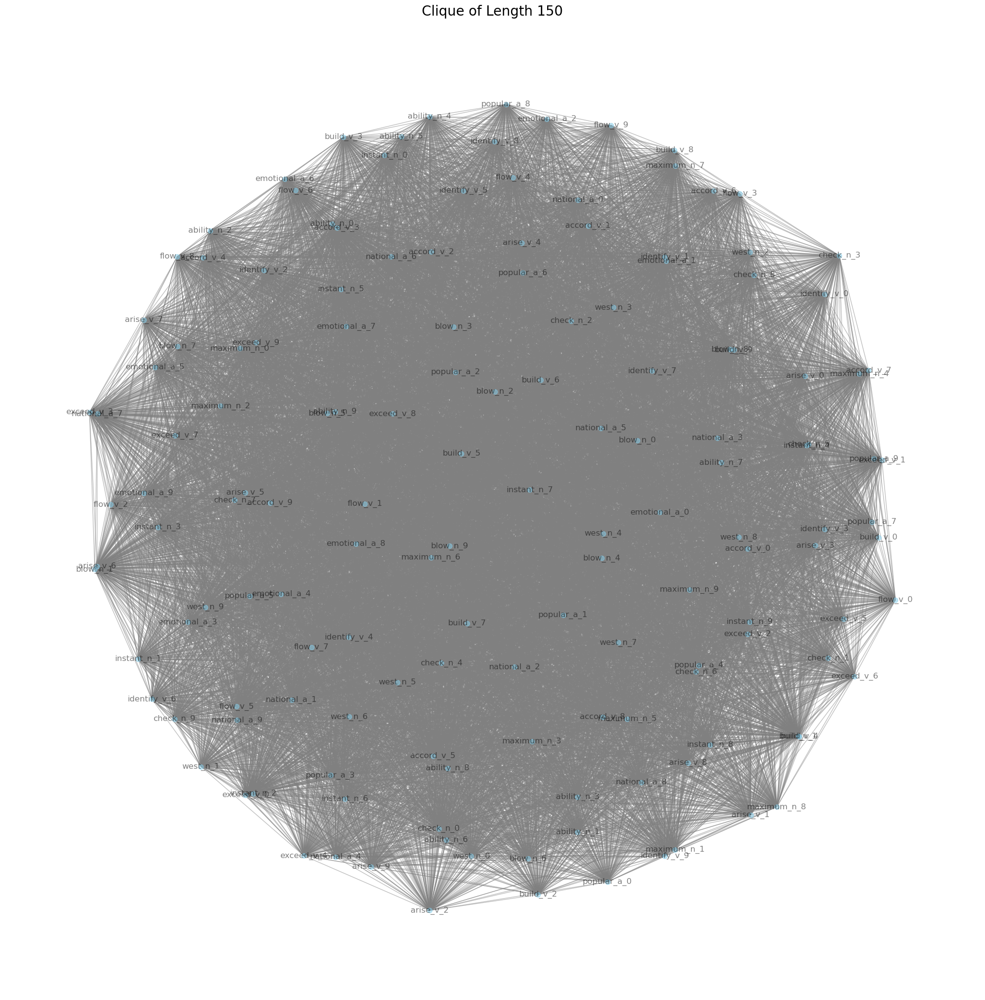

In [209]:
import networkx as nx
import matplotlib.pyplot as plt
from itertools import product


# Assuming clique_150 is the list containing the clique of length 150
# Assuming G is the original graph

# Create a new graph for the clique
G_clique_150 = nx.Graph()

# Add nodes from the clique
G_clique_150.add_nodes_from(clique_150)

# Add edges from the original graph that exist between nodes in the clique
clique_product_list = [(x, y) for x, y in product(clique_150, repeat=2) if x != y]
product_list = [(x, y) for x, y in clique_product_list if (y, x) not in clique_product_list]
new_product_list = []
for x, y in clique_product_list:
    if (y, x) in new_product_list:
        continue
    else:
        new_product_list.append((x, y))
print(len(new_product_list))
clique_edges = [(u, v) for u, v in new_product_list  if G.has_edge(u, v)]

# Add the edges to the clique graph
G_clique_150.add_edges_from(clique_edges)

# Generate positions for the nodes using a spring layout algorithm
pos = nx.spring_layout(G_clique_150, seed=42)

# Draw the graph
plt.figure(figsize=(20, 20))
nx.draw(G_clique_150, pos, with_labels=True, node_size=50, node_color='skyblue', edge_color='gray', alpha=0.5)

# Customize the plot
plt.title("Clique of Length 150", fontsize=20)
plt.axis('off')

# Show the plot
plt.show()


In [190]:
clique_edges = [(u, v) for u in clique_150 for v in clique_150 if G.has_edge(u, v)]
print(len(clique_edges))

22350


In [193]:
# for u in clique_150:
#     print(u, end = ' ')
#     for v in clique_150:
#         if G.has_edge(u, v):
#             print(' has an edge with ', v)
#         else:
#             print(' has no edge with ', v)

In [195]:
from itertools import product

# Find the product of the list with itself, excluding pairs with the same elements
product_list = [(x, y) for x, y in product(clique_150, repeat=2) if x != y]

# Output the result
print(product_list)

[('arise_v_9', 'flow_v_2'), ('arise_v_9', 'instant_n_2'), ('arise_v_9', 'identify_v_1'), ('arise_v_9', 'ability_n_2'), ('arise_v_9', 'maximum_n_3'), ('arise_v_9', 'national_a_5'), ('arise_v_9', 'arise_v_4'), ('arise_v_9', 'maximum_n_0'), ('arise_v_9', 'instant_n_4'), ('arise_v_9', 'west_n_3'), ('arise_v_9', 'flow_v_3'), ('arise_v_9', 'build_v_5'), ('arise_v_9', 'instant_n_7'), ('arise_v_9', 'ability_n_6'), ('arise_v_9', 'maximum_n_9'), ('arise_v_9', 'accord_v_8'), ('arise_v_9', 'ability_n_7'), ('arise_v_9', 'ability_n_9'), ('arise_v_9', 'exceed_v_2'), ('arise_v_9', 'blow_n_7'), ('arise_v_9', 'popular_a_2'), ('arise_v_9', 'arise_v_8'), ('arise_v_9', 'maximum_n_4'), ('arise_v_9', 'national_a_2'), ('arise_v_9', 'accord_v_7'), ('arise_v_9', 'national_a_9'), ('arise_v_9', 'identify_v_7'), ('arise_v_9', 'check_n_9'), ('arise_v_9', 'exceed_v_8'), ('arise_v_9', 'build_v_9'), ('arise_v_9', 'flow_v_0'), ('arise_v_9', 'identify_v_9'), ('arise_v_9', 'ability_n_1'), ('arise_v_9', 'ability_n_8'), ('

In [203]:
for u, v in product_list:
    if G.has_edge(u, v):
        print(u, ' has an edge with ', v)
    else:
        print(u, ' has no edge with ', v)

arise_v_9  has an edge with  flow_v_2
arise_v_9  has an edge with  instant_n_2
arise_v_9  has an edge with  identify_v_1
arise_v_9  has an edge with  ability_n_2
arise_v_9  has an edge with  maximum_n_3
arise_v_9  has an edge with  national_a_5
arise_v_9  has an edge with  arise_v_4
arise_v_9  has an edge with  maximum_n_0
arise_v_9  has an edge with  instant_n_4
arise_v_9  has an edge with  west_n_3
arise_v_9  has an edge with  flow_v_3
arise_v_9  has an edge with  build_v_5
arise_v_9  has an edge with  instant_n_7
arise_v_9  has an edge with  ability_n_6
arise_v_9  has an edge with  maximum_n_9
arise_v_9  has an edge with  accord_v_8
arise_v_9  has an edge with  ability_n_7
arise_v_9  has an edge with  ability_n_9
arise_v_9  has an edge with  exceed_v_2
arise_v_9  has an edge with  blow_n_7
arise_v_9  has an edge with  popular_a_2
arise_v_9  has an edge with  arise_v_8
arise_v_9  has an edge with  maximum_n_4
arise_v_9  has an edge with  national_a_2
arise_v_9  has an edge with  acco

In [201]:
len(product_list)

22350

In [202]:
# clique_edges = [(u, v) for u, v in clique_product_list  if G.has_edge(u, v)]
len(clique_edges)

22350

In [205]:
(150*149)

22350